## Load EEG data 24h

In [1]:

import pyedflib
file_name = "by captain borat/raw/EEG_0_per_hour_2024-03-20 17_12_18.edf"
try:
        f = pyedflib.EdfReader(file_name)
        n = f.signals_in_file
        signal_labels = f.getSignalLabels()
        n_samples = f.getNSamples()[0]
        data = f.readSignal(0)
        print(f"Archivo: {file_name}")
        print(f"Número de señales: {n}")
        print("Etiquetas de señal:", signal_labels)
        print(f"Muestras en la primera señal: {n_samples}")
        f._close()
except Exception as e:
        print(f"Error al leer el archivo EDF: {e}")


Archivo: by captain borat/raw/EEG_0_per_hour_2024-03-20 17_12_18.edf
Número de señales: 1
Etiquetas de señal: ['Temp']
Muestras en la primera señal: 44153856


In [2]:
import numpy as np
from scipy.interpolate import interp1d
# Define the sliding window size in samples
fs=512
window_size = 100 * fs  # 100 seconds * sampling frequency

# Create a copy of data_interpolated to modify
data_interpolated_copy = data.copy()

# Iterate through the data with a sliding window
for start in range(0, len(data), window_size):
    end = min(start + window_size, len(data))
    window_data = data[start:end]
    
    # Calculate mean and standard deviation for the current window
    window_mean = np.mean(window_data)
    window_std = np.std(window_data)
    
    # Define thresholds for outliers
    lower_threshold = window_mean - 3 * window_std
    upper_threshold = window_mean + 3 * window_std
    
    # Identify outliers in the window
    outliers = (window_data < lower_threshold) | (window_data > upper_threshold)
    
    # Interpolate outliers
    if np.any(outliers):
        valid_indices = np.where(~outliers)[0]
        interp_func = interp1d(valid_indices, window_data[~outliers], kind='linear', fill_value="extrapolate")
        outlier_indices = np.where(outliers)[0]
        data_interpolated_copy[start:end][outliers] = interp_func(outlier_indices)

# Update data_interpolated with the modified data
data_interpolated = data_interpolated_copy

In [3]:
# Truncate the data signal from 40000 to 45000 seconds for quick testing
fs=512
start_sample = 40000 * fs  # Convert start time to samples
end_sample = 45000 * fs    # Convert end time to samples
new_data = data_interpolated[start_sample:end_sample]

print(f"New data shape: {new_data.shape}")

New data shape: (2560000,)


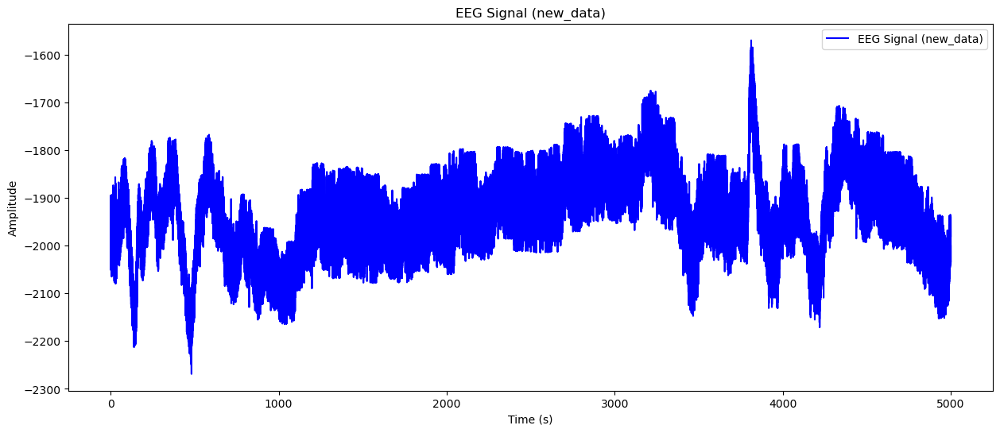

In [4]:
import matplotlib.pyplot as plt
t_data = np.arange(len(new_data)) / fs  # Time in seconds
# Plot new_data
plt.figure(figsize=(15, 6))
plt.plot(t_data, new_data, label="EEG Signal (new_data)", color='blue')
plt.title("EEG Signal (new_data)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.show()

## DMD + bilstm + kmeans for clustering

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import detrend, butter, filtfilt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
import tensorflow as tf
import torch  # Add PyTorch import
import torch.nn as nn  # Add PyTorch neural network module
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

2025-05-30 11:51:43.328923: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [6]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from pydmd import DMD

# Check PyTorch GPU availability
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"PyTorch using device: {device}")


PyTorch using device: cuda


In [7]:

def preprocess_eeg(signal, fs):
    """Preprocess the EEG signal with filtering and normalization"""
    # Convert to PyTorch tensor if needed for later operations
    signal_tensor = torch.tensor(signal, dtype=torch.float32).to(device)
    
    # Apply bandpass filter (0.5-30 Hz for sleep EEG)
    nyq = 0.5 * fs
    low = 0.5 / nyq
    high = 80.0 / nyq
    b, a = butter(3, [low, high], btype='band')
    
    # Move back to CPU for filtfilt which doesn't support GPU
    filtered = filtfilt(b, a, signal_tensor.cpu().numpy())
    
    # Detrend to remove linear trends
    detrended = detrend(filtered)
    
    # Normalize
    scaler = StandardScaler()
    normalized = scaler.fit_transform(detrended.reshape(-1, 1)).flatten()
    
    #regularize
    normalized = np.clip(normalized, -1, 1)  # Regularization step
    return normalized


In [8]:

# PART 2: Create windowed segments for analysis
def create_windows(signal, window_size, overlap=0.5):
    """Create overlapping windows from the signal"""
    # Convert to PyTorch tensor
    signal_tensor = torch.tensor(signal, dtype=torch.float32).to(device)
    
    step = int(window_size * (1 - overlap))
    n_windows = (len(signal) - window_size) // step + 1
    windows = torch.zeros((n_windows, window_size), dtype=torch.float32, device=device)
    
    for i in range(n_windows):
        start = i * step
        windows[i] = signal_tensor[start:start+window_size]
    
    # Convert back to numpy for compatibility with existing functions
    return windows.cpu().numpy()


In [9]:
# ignore the warnings
def extract_dmd_features(windows, rank=20, embedding_dim=40):
    """Extract DMD features from signal windows"""
    n_windows = windows.shape[0]
    device_windows = torch.tensor(windows, dtype=torch.float32).to(device)
    
    # Prepare feature arrays on GPU
    eigenvalues_real = torch.zeros((n_windows, rank), dtype=torch.float32, device=device)
    eigenvalues_imag = torch.zeros((n_windows, rank), dtype=torch.float32, device=device)
    amplitudes = torch.zeros((n_windows, rank), dtype=torch.float32, device=device)
    frequencies = torch.zeros((n_windows, rank), dtype=torch.float32, device=device)
    
    for i in range(n_windows):
        # Move back to CPU for DMD computation (since pydmd uses NumPy)
        window = device_windows[i].cpu().numpy()
        # Create Hankel matrix (time-delay embedding)
        hankel = np.zeros((embedding_dim, len(window) - embedding_dim + 1))
        for j in range(embedding_dim):
            hankel[j, :] = window[j:j+hankel.shape[1]]
        
        # Apply DMD
        dmd = DMD(svd_rank=rank)
        dmd.fit(hankel)
        
        # Sort by amplitude
        idx = np.argsort(np.abs(dmd.amplitudes))[::-1][:rank]
        sorted_eigs = dmd.eigs[idx]
        sorted_amps = np.abs(dmd.amplitudes[idx])
        sorted_freqs = np.abs(dmd.frequency[idx])
        
        # Store features (transfer back to GPU)
        eigenvalues_real[i] = torch.tensor(np.real(sorted_eigs), dtype=torch.float32)
        eigenvalues_imag[i] = torch.tensor(np.imag(sorted_eigs), dtype=torch.float32)
        amplitudes[i] = torch.tensor(sorted_amps, dtype=torch.float32)
        frequencies[i] = torch.tensor(sorted_freqs, dtype=torch.float32)
    
    # Combine features and move back to CPU for sklearn compatibility
    features = torch.cat((eigenvalues_real, eigenvalues_imag, amplitudes, frequencies), dim=1).cpu().numpy()
    return features


In [10]:

# PART 4: Unsupervised clustering for sleep stages
def cluster_sleep_stages(features, n_clusters):
    """Cluster DMD features into sleep stages"""
    # Dimensionality reduction with t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    features_2d = tsne.fit_transform(features)
    
    # K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    labels = kmeans.fit_predict(features)
    
    # Visualize clusters
    plt.figure(figsize=(10, 8))
    for i in range(n_clusters):
        plt.scatter(features_2d[labels == i, 0], features_2d[labels == i, 1], label=f'Cluster {i}')
    plt.legend()
    plt.title('Sleep Stage Clusters')
    plt.xlabel('t-SNE dimension 1')
    plt.ylabel('t-SNE dimension 2')
    plt.show()
    
    return labels, features_2d


In [11]:

# PART 6: Detect transition points for micro-arousals
def detect_transitions(labels, threshold=0.5):
    """Detect potential micro-arousals from stage transitions"""
    transitions = []
    
    # Convert to PyTorch tensor if not already
    if not isinstance(labels, torch.Tensor):
        labels_tensor = torch.tensor(labels, dtype=torch.long).to(device)
    else:
        labels_tensor = labels
    
    # Compute transition probability between consecutive windows
    for i in range(1, len(labels_tensor)):
        if labels_tensor[i] != labels_tensor[i-1]:
            transitions.append(i)
    
    return transitions


In [12]:
# Check TensorFlow GPU availability
print("TensorFlow - Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# Check PyTorch GPU availability
print(f"PyTorch - CUDA Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"PyTorch - Current CUDA Device: {torch.cuda.current_device()}")
    print(f"PyTorch - Device Name: {torch.cuda.get_device_name(torch.cuda.current_device())}")

TensorFlow - Num GPUs Available:  1
PyTorch - CUDA Available: True
PyTorch - Current CUDA Device: 0
PyTorch - Device Name: NVIDIA GeForce GTX 1080 Ti


In [13]:
class BiLSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout=0.3):
        super(BiLSTMModel, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        
        # BiLSTM layer
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True, bidirectional=True, dropout=dropout)
        
        # Fully connected layer
        self.fc = nn.Linear(hidden_size * 2, output_size)  # Multiply by 2 for bidirectional
        
        # Activation function
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        # Initialize hidden and cell states
        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(device)  # 2 for bidirectional
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_size).to(device)
        
        # Forward propagate LSTM
        out, _ = self.lstm(x, (h0, c0))
        
        # Decode the last hidden state
        out = self.fc(out[:, -1, :])  # Take the last time step
        out = self.sigmoid(out)
        return out

def create_bilstm_model(input_size, hidden_size, num_layers, output_size, dropout=0.3):
    """Create and return a BiLSTM model."""
    model = BiLSTMModel(input_size, hidden_size, num_layers, output_size, dropout)
    return model

In [14]:
# PART 7: Full analysis pipeline with BiLSTM - without plotting
def analyze_sleep_eeg_with_bilstm(signal, fs, bilstm_model, window_size=30*fs, overlap=0.5):
    """Complete analysis pipeline for sleep EEG using BiLSTM, without plotting"""
    # Step 1: Preprocess
    preprocessed = preprocess_eeg(signal, fs)
    
    # Step 2: Create windows
    windows = create_windows(preprocessed, window_size, overlap=overlap)
    
    # Step 3: Extract DMD features
    features = extract_dmd_features(windows, rank=20, embedding_dim=40)
    
    # Step 4: Use BiLSTM for predictions
    bilstm_model.eval()  # Set model to evaluation mode
    with torch.no_grad():
        # Convert features to PyTorch tensor
        features_tensor = torch.tensor(features, dtype=torch.float32).to(device)
        predictions = bilstm_model(features_tensor.unsqueeze(1))  # Add sequence dimension if needed
        predictions = predictions.squeeze().cpu().numpy()  # Convert predictions to numpy array
    
    # Step 5: Augment features with BiLSTM predictions for clustering
    # Reshape predictions to add as an additional feature column
    predictions_reshaped = predictions.reshape(-1, 1)
    augmented_features = np.hstack((features, predictions_reshaped))
    
    # Step 6: Cluster sleep stages using augmented features
    # t-SNE for dimensionality reduction
    tsne = TSNE(n_components=2, random_state=42)
    features_2d = tsne.fit_transform(augmented_features)
    
    # K-means clustering on augmented features
    kmeans = KMeans(n_clusters=4, random_state=42)
    labels = kmeans.fit_predict(augmented_features)
    
    # Calculate time points for each window
    step = int(window_size * (1 - overlap))
    window_times = np.arange(len(labels)) * step / fs  # in seconds
    
    return {
        'features': features,
        'augmented_features': augmented_features,
        'labels': labels,
        'predictions': predictions,
        'features_2d': features_2d,
        'window_times': window_times,  # Add window times for plotting
        'preprocess_eeg': preprocessed,
        'window_size': window_size,
        'step': step,
        'fs': fs
    }


In [15]:
# Separate plotting function for interactive visualization
def plot_sleep_eeg_results(results, start=0, end=None):
    """Create interactive plots of sleep EEG analysis results
    
    Args:
        results (dict): Results dictionary from analyze_sleep_eeg_with_bilstm
        start (int/float): Start time in seconds
        end (int/float): End time in seconds (None to plot until the end)
    """
    # Extract data from results
    predictions = results['predictions']
    labels = results['labels']
    features_2d = results['features_2d']
    window_times = results['window_times']
    
    # Apply time filtering
    if end is None:
        end = window_times[-1]
    
    # Filter data by time range
    time_mask = (window_times >= start) & (window_times <= end)
    plot_times = window_times[time_mask]
    plot_predictions = predictions[time_mask]
    plot_labels = labels[time_mask]
    
    # Create subplot layout
    fig = make_subplots(rows=2, cols=1, subplot_titles=(
        'BiLSTM Predictions',
        'Sleep Stage Hypnogram (After BiLSTM)'
    ))
    
    # Add BiLSTM predictions trace
    fig.add_trace(
        go.Scatter(x=plot_times, y=plot_predictions, mode='lines', name='BiLSTM Predictions',
                  line=dict(color='orange')),
        row=1, col=1
    )
    
    # Add hypnogram trace
    fig.add_trace(
        go.Scatter(x=plot_times, y=plot_labels, mode='lines+markers', name='Cluster Labels',
                  line=dict(color='blue', shape='hv')),
        row=2, col=1
    )
    
    # Update layout
    fig.update_layout(
        height=600,
        title_text=f'Sleep EEG Analysis (Time Range: {start}s - {end}s)',
        hovermode='closest'
    )
    
    # X-axis titles
    fig.update_xaxes(title_text='Time (s)', row=2, col=1)
    
    # Y-axis titles
    fig.update_yaxes(title_text='Prediction Value', row=1, col=1)
    fig.update_yaxes(title_text='Sleep Stage', row=2, col=1)
    
    fig.show()
    
    # Create separate figure for t-SNE visualization
    # Convert the data to a DataFrame for proper handling of hover_data
    import pandas as pd
    tsne_df = pd.DataFrame({
        'tsne_1': features_2d[:, 0],
        'tsne_2': features_2d[:, 1],
        'cluster': labels
    })
    
    # Use a consistent color scale for the clusters
    tsne_fig = px.scatter(
        tsne_df,
        x='tsne_1', y='tsne_2',
        color='cluster',
        color_continuous_scale='viridis',
        title='Feature Space with BiLSTM Predictions (t-SNE)',
        labels={'tsne_1': 't-SNE dimension 1', 'tsne_2': 't-SNE dimension 2', 'cluster': 'Cluster'}
    )
    
    # Add trajectory line
    tsne_fig.add_trace(
        go.Scatter(
            x=features_2d[:, 0], y=features_2d[:, 1],
            mode='lines',
            line=dict(color='black', width=1),
            opacity=0.3,
            name='Trajectory'
        )
    )
    
    tsne_fig.show()


In [16]:
# Function to visualize raw EEG data alongside predictions
def plot_eeg_with_predictions(signal, results, fs, start=0, end=None):
    """Create interactive plots of raw EEG data alongside predictions
    
    Args:
        signal (numpy.ndarray): Raw EEG signal
        results (dict): Results dictionary from analyze_sleep_eeg_with_bilstm
        fs (int): Sampling frequency
        start (int/float): Start time in seconds
        end (int/float): End time in seconds (None to plot until the end)
    """
    # Extract data from results
    predictions = results['predictions']
    labels = results['labels']
    window_times = results['window_times']
    step = results['step']
    
    # Create time array for the signal
    signal_times = np.arange(len(signal)) / fs
    
    # Apply time filtering
    if end is None:
        end = min(signal_times[-1], window_times[-1])
    
    # Filter signal data
    signal_mask = (signal_times >= start) & (signal_times <= end)
    plot_signal_times = signal_times[signal_mask]
    plot_signal = signal[signal_mask]
    
    # Filter results data
    window_mask = (window_times >= start) & (window_times <= end)
    plot_window_times = window_times[window_mask]
    plot_predictions = predictions[window_mask]
    plot_labels = labels[window_mask]
    
    # Create subplot layout
    fig = make_subplots(rows=3, cols=1, subplot_titles=(
        'Raw EEG Signal',
        'BiLSTM Predictions',
        'Sleep Stage Hypnogram'
    ), vertical_spacing=0.1)
    
    # Add raw EEG trace
    fig.add_trace(
        go.Scatter(x=plot_signal_times, y=plot_signal, mode='lines', name='EEG Signal',
                  line=dict(color='green', width=1)),
        row=1, col=1
    )
    
    # Add BiLSTM predictions trace
    fig.add_trace(
        go.Scatter(x=plot_window_times, y=plot_predictions, mode='lines', name='BiLSTM Predictions',
                  line=dict(color='orange')),
        row=2, col=1
    )
    
    # Add hypnogram trace
    fig.add_trace(
        go.Scatter(x=plot_window_times, y=plot_labels, mode='lines+markers', name='Cluster Labels',
                  line=dict(color='blue', shape='hv')),
        row=3, col=1
    )
    
    # Update layout
    fig.update_layout(
        height=800,
        title_text=f'EEG Analysis with Predictions (Time Range: {start}s - {end}s)',
        hovermode='closest'
    )
    
    # X-axis titles
    fig.update_xaxes(title_text='Time (s)', row=3, col=1)
    
    # Y-axis titles
    fig.update_yaxes(title_text='Amplitude', row=1, col=1)
    fig.update_yaxes(title_text='Prediction Value', row=2, col=1)
    fig.update_yaxes(title_text='Sleep Stage', row=3, col=1)
    
    fig.show()


In [17]:
# Create and load the BiLSTM model
fs=512
input_size = 80  # Adjust based on feature size
hidden_size = 64
num_layers = 2
output_size = 1
bilstm_model = create_bilstm_model(input_size, hidden_size, num_layers, output_size)
bilstm_model.to(device)

# Run the pipeline with the BiLSTM model
results_bilstm = analyze_sleep_eeg_with_bilstm(data_interpolated, fs, bilstm_model)

# Access specific keys from the results dictionary if needed
patterns_bilstm = results_bilstm['features']
sleep_results_bilstm = results_bilstm['labels']
predictions_bilstm = results_bilstm['predictions']
preprocess_eeg_bilstm = results_bilstm['preprocess_eeg']

In [18]:
# Plot with time range control
# First 500 seconds
plot_sleep_eeg_results(results_bilstm, start=500, end=1500)

In [19]:
# Plot EEG data alongside predictions
plot_eeg_with_predictions(preprocess_eeg_bilstm, results_bilstm, fs, start=0, end=300)

In [20]:
import os
import pickle
import json
from datetime import datetime

# Create results directory if it doesn't exist
results_dir = "results"
os.makedirs(results_dir, exist_ok=True)

# Define the output filename
output_filename = os.path.join(results_dir, "bilstm_30s_4clusters")

# Prepare metadata
metadata = {
    "model_type": "BiLSTM + KMeans",
    "window_size_seconds": 30,  # window_size / fs in seconds
    "window_size_samples": results_bilstm["window_size"],
    "num_clusters": 4,
    "overlap": 0.5,
    "fs": fs,
    "hidden_size": hidden_size,
    "num_layers": num_layers,
    "input_size": input_size,
    "output_size": output_size,
    "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S")
}

# Save using pickle (for full results with numpy arrays)
with open(f"{output_filename}.pkl", "wb") as f:
    pickle.dump({
        "results": results_bilstm,
        "metadata": metadata,
        "model_state": bilstm_model.state_dict()  # Save model parameters
    }, f)

# Save metadata as JSON (for easy human readability)
with open(f"{output_filename}_metadata.json", "w") as f:
    # Convert numpy values to standard Python types for JSON serialization
    metadata_json = {k: v if not isinstance(v, (np.ndarray, np.generic)) else v.item() if np.isscalar(v) else v.tolist() 
                    for k, v in metadata.items()}
    json.dump(metadata_json, f, indent=4)

print(f"Results saved to {output_filename}.pkl")
print(f"Metadata saved to {output_filename}_metadata.json")

Results saved to results/bilstm_30s_4clusters.pkl
Metadata saved to results/bilstm_30s_4clusters_metadata.json


In [ ]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt

# Create a dataframe for easier analysis if not already created
if 'cluster_df' not in locals() or not isinstance(cluster_df, pd.DataFrame):
    cluster_df = pd.DataFrame({
        'Cluster': sleep_results_bilstm,
        'Window_Time': results_bilstm['window_times']
    })

# 1. Basic cluster count distribution
cluster_counts = cluster_df['Cluster'].value_counts().sort_index()
cluster_percentages = cluster_df['Cluster'].value_counts(normalize=True).sort_index() * 100

# 2. Calculate continuous runs of each cluster
# This identifies sequences where the cluster label remains the same
cluster_df['Run_Group'] = (cluster_df['Cluster'] != cluster_df['Cluster'].shift()).cumsum()
runs_df = cluster_df.groupby(['Run_Group', 'Cluster']).size().reset_index(name='Duration_Windows')

# Convert duration from windows to seconds (each window is 30 seconds)
runs_df['Duration_Seconds'] = runs_df['Duration_Windows'] * 30
runs_df['Duration_Minutes'] = runs_df['Duration_Seconds'] / 60

# 3. Statistics on runs by cluster
run_stats = runs_df.groupby('Cluster').agg({
    'Duration_Windows': ['count', 'min', 'max', 'mean', 'median', 'std', 'sum'],
    'Duration_Minutes': ['min', 'max', 'mean', 'median', 'std', 'sum']
})

# Calculate percentage of time spent in each cluster
total_minutes = runs_df['Duration_Minutes'].sum()
time_percentage = run_stats[('Duration_Minutes', 'sum')] / total_minutes * 100

# Create a figure with multiple subplots for visualization
fig = plt.figure(figsize=(16, 12))
gs = fig.add_gridspec(2, 2)

# Plot 1: Cluster distribution
ax1 = fig.add_subplot(gs[0, 0])
bars = ax1.bar(cluster_counts.index, cluster_counts.values, color='skyblue')
ax1.set_title('Cluster Count Distribution')
ax1.set_xlabel('Cluster')
ax1.set_ylabel('Count')
ax1.set_xticks(cluster_counts.index)

# Add count and percentage labels
for bar, count, percentage in zip(bars, cluster_counts, cluster_percentages):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2, height + 10, 
             f'{count}\n({percentage:.1f}%)', 
             ha='center', va='bottom')

# Plot 2: Distribution of continuous run durations per cluster
ax2 = fig.add_subplot(gs[0, 1])
boxplot = ax2.boxplot([runs_df[runs_df['Cluster'] == c]['Duration_Minutes'] for c in sorted(runs_df['Cluster'].unique())],
                     labels=sorted(runs_df['Cluster'].unique()),
                     patch_artist=True)

# Color the boxplots
colors = ['lightblue', 'lightgreen', 'salmon', 'lightyellow']
for patch, color in zip(boxplot['boxes'], colors[:len(boxplot['boxes'])]):
    patch.set_facecolor(color)

ax2.set_title('Distribution of Continuous Run Durations')
ax2.set_xlabel('Cluster')
ax2.set_ylabel('Duration (minutes)')
ax2.grid(True, linestyle='--', alpha=0.7)

# Plot 3: Top 20 longest continuous runs
ax3 = fig.add_subplot(gs[1, 0])
top_runs = runs_df.sort_values('Duration_Minutes', ascending=False).head(20)
top_runs_plot = ax3.bar(range(len(top_runs)), top_runs['Duration_Minutes'], 
                        color=[colors[c % len(colors)] for c in top_runs['Cluster']])
ax3.set_title('Top 20 Longest Continuous Runs')
ax3.set_xlabel('Run Index')
ax3.set_ylabel('Duration (minutes)')
ax3.set_xticks(range(len(top_runs)))
ax3.set_xticklabels([f"C{c}" for c in top_runs['Cluster']], rotation=45)

# Plot 4: Histogram of run durations by cluster
ax4 = fig.add_subplot(gs[1, 1])
for i, cluster in enumerate(sorted(runs_df['Cluster'].unique())):
    cluster_data = runs_df[runs_df['Cluster'] == cluster]['Duration_Minutes']
    ax4.hist(cluster_data, bins=20, alpha=0.5, label=f'Cluster {cluster}')

ax4.set_title('Histogram of Run Durations')
ax4.set_xlabel('Duration (minutes)')
ax4.set_ylabel('Frequency')
ax4.legend()
ax4.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Print detailed statistics
print("Cluster Count Distribution:")
print(cluster_counts)
print("\nCluster Percentage Distribution:")
print(cluster_percentages)
print("\nContinuous Run Statistics (in windows of 30 seconds each):")
print(run_stats)
print("\nPercentage of Total Time Spent in Each Cluster:")
print(time_percentage)

# Calculate transitions between clusters
transitions_matrix = pd.crosstab(
    cluster_df['Cluster'][:-1],  # from cluster
    cluster_df['Cluster'][1:],   # to cluster
    normalize='index'
) * 100

print("\nTransition Probabilities Between Clusters (%):")
print(transitions_matrix)